# Linear Regression

### Imports and Seed

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sklearn as sk
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error

Getting seed

In [2]:
with open("seed.txt", "r") as f:
    my_seed = int(f.read().strip())

print(f"Seed: {my_seed}")

Seed: 3356680259


In [3]:
np.random.default_rng(my_seed)

Generator(PCG64) at 0x7792F4E48AC0

getting the student dataset from Q1


In [4]:
class StudentDataset:
    def __init__(self,num_students:int,seed:int):
        self.rng = np.random.default_rng(seed)
        self.total = num_students
        self.df = self.assemble_dataframe()

    def get_full_dataframe(self):
        return self.df #getter?

    def assemble_dataframe(self):
        df = pd.DataFrame({"id": range(1, self.total + 1)})
        df["gender"] = self.generate_gender()
        df["major"] = self.generate_major()
        df["program"] = self.generate_program(df["major"].tolist())
        df["GPA"] = self.generate_gpa(df["major"].tolist())
        return df
    
    def generate_gender(self):
        gender_list = []
        rng = self.rng
        for _ in range(self.total):
            r = rng.random()
            if r < 0.65:
                gender_list.append("Male")
            elif r < 0.65 + 0.33:
                gender_list.append("Female")
            else:
                gender_list.append("Other")
        return gender_list

    def generate_major(self):
        major_list = []
        rng = self.rng
        for _ in range(self.total):
            r = rng.random()
            if r < 0.7:
                major_list.append("B.Tech")
            elif r < 0.7 + 0.2:
                major_list.append("MS")
            else:
                major_list.append("PhD")
        return major_list
    
    def generate_program(self,majors:list[str]):
        program_list = []
        rng = self.rng

        for major in majors:
            if major == "B.Tech":
                program_list.append(rng.choice(["CSE", "ECE", "CHD", "CND"],p=[0.4,0.4,0.1,0.1]))
            elif major == "MS":
                program_list.append(rng.choice(["CSE", "ECE", "CHD", "CND"],p=[0.3,0.3,0.2,0.2]))
            else:
                program_list.append(rng.choice(["CSE", "ECE", "CHD", "CND"])) ## all are same nahi likhuga ;)
        return program_list
    
    def generate_gpa(self,majors:list[str]):
        gpa_list = []
        rng = self.rng
        for major in majors:
            if major == "B.Tech":
                val = rng.normal(7.0,1.0)
                
            elif major == "MS":
                val = rng.normal(8.0,0.7)
            else:
                val = rng.normal(8.3,0.5)
            val = np.clip(val,4.0,10.0)
            gpa_list.append(val)
        return gpa_list 

creating instance of now as per the question will use it

In [5]:
stud_data = StudentDataset(10000,my_seed)
df = stud_data.get_full_dataframe()
df.head()

,id,gender,major,program,GPA
0,1,Male,B.Tech,CSE,8.947960
1,2,Female,B.Tech,ECE,9.653932
2,3,Male,B.Tech,ECE,7.281660
3,4,Male,B.Tech,CSE,6.248276
4,5,Male,PhD,CND,8.913198


In [6]:
class PerFeatureTransformer:
    def __init__(self):
        self.transformers = {}

    def fit(self, df: pd.DataFrame, params: dict[str, str]) :
        feature_name_list = []
        for col, t_type in params.items():
            if t_type == "standard":
                transformer = StandardScaler()
                transformer.fit(df[[col]])
            elif t_type == "ordinal":
                categories = [sorted(df[col].dropna().unique().tolist())]
                transformer = OrdinalEncoder(categories=categories)
                transformer.fit(df[[col]])
            elif t_type == "onehot":
                print(f"col is {col}")
                transformer = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
                transformer.fit(df[[col]])
                arr = transformer.get_feature_names_out([col])
                # arr = arr.to_list()
                feature_name_list.append(arr.tolist())
            self.transformers[col] = (t_type, transformer)
        return [name for group in feature_name_list for name in group]


    def transform(self, df: pd.DataFrame) -> np.ndarray:
        arrays = []
        for col, (t_type, transformer) in self.transformers.items():
            arr = transformer.transform(df[[col]])
            # print(f"ttype : {t_type},shape : {arr.shape}")
            arrays.append(arr)
        return np.hstack(arrays)

    def fit_transform(self, df: pd.DataFrame, params: dict[str, str]) :
        list_name = self.fit(df, params)
        return list_name,self.transform(df)

In [7]:
def train_val_test_split(student_df, test_size: float = 0.2, val_size: float = 0.2, seed: int = 42):
        # First split: separate test set (20%)
        train_val_df, test_df = train_test_split(student_df, test_size=test_size, random_state=seed)
        train_df, val_df = train_test_split(train_val_df, test_size=val_size/(1-test_size), random_state=seed)
        return train_df, val_df, test_df

In [8]:
transformer_obj = PerFeatureTransformer()

In [9]:
train_df, val_df, test_df = train_val_test_split(df, test_size=0.2, val_size=0.2, seed=my_seed)

In [10]:
train_df.head()

,id,gender,major,program,GPA
1236,1237,Female,B.Tech,ECE,6.567598
753,754,Other,B.Tech,CHD,6.387686
9665,9666,Male,B.Tech,ECE,7.001458
200,201,Male,MS,CND,8.281477
7800,7801,Male,B.Tech,CSE,6.804556


In [11]:
val_df.head()

,id,gender,major,program,GPA
9740,9741,Male,B.Tech,CSE,5.571052
464,465,Male,MS,CHD,7.833013
2635,2636,Female,B.Tech,CSE,8.319507
4344,4345,Female,B.Tech,CND,6.455518
7127,7128,Male,B.Tech,ECE,7.743094


In [12]:
test_df.head()

,id,gender,major,program,GPA
2417,2418,Female,PhD,CND,7.620535
6205,6206,Male,B.Tech,CND,7.676731
9537,9538,Male,B.Tech,ECE,7.273368
3389,3390,Male,B.Tech,CSE,7.981971
6068,6069,Male,B.Tech,ECE,6.340239


In [13]:
params = {
    "gender" : "onehot",
    "major" : "onehot",
    "program" : "onehot",
}

feature_name,X_train = transformer_obj.fit_transform(train_df,params=params)
y_train = train_df["GPA"].values
# print(X_train[:5])
X_val = transformer_obj.transform(val_df)
y_val = val_df["GPA"].values

X_test = transformer_obj.transform(test_df)
y_test = test_df["GPA"].values

print(feature_name)

col is gender
col is major
col is program
['gender_Female', 'gender_Male', 'gender_Other', 'major_B.Tech', 'major_MS', 'major_PhD', 'program_CHD', 'program_CND', 'program_CSE', 'program_ECE']


In [14]:
class PolynomialRegression:

    def _add_watermark(self, ax):
        """Helper to add watermark to a plot."""
        ax.text(0.95, 0.95, "nidhish.jain",
                ha='right', va='top',
                transform=ax.transAxes,
                fontsize=10, color='gray', alpha=0.7)
        
    def run_poly_regression (self, X_train , y_train ,
                                X_val , y_val ,
                                X_test , y_test ,
                                degree =1 ,
                                regularizer = None ,
                                reg_strength =0.0) :
        """
        Fit a polynomial regression model with optional regularization .
        Parameters :
        degree ( int ) : Degree of the polynomial to fit
        regularizer ( str or None ) : ’ l1 ’, ’ l2 ’, or None
        reg_strength ( float ) : Regularization coefficient ( alpha )
        Returns :
        dict with train , val , and test MSEs , and learned
        coefficients
        """
        ###ok lets start 
        poly = PolynomialFeatures(degree=degree, include_bias=False)
        X_train_poly = poly.fit_transform(X_train)
        X_val_poly   = poly.transform(X_val)
        X_test_poly  = poly.transform(X_test)
        poly_feature_names = poly.get_feature_names_out(feature_name)
        if regularizer is None:
            model = LinearRegression()
        elif regularizer == "l1":
            model = Lasso(alpha=reg_strength,max_iter=1000)
        elif regularizer == "l2":
            model = Ridge(alpha=reg_strength,max_iter=1000)
        model.fit(X_train_poly, y_train)

        y_train_pred = model.predict(X_train_poly)
        y_val_pred = model.predict(X_val_poly)
        y_test_pred = model.predict(X_test_poly)

        train_mse = mean_squared_error(y_train, y_train_pred)
        val_mse = mean_squared_error(y_val, y_val_pred)
        test_mse = mean_squared_error(y_test, y_test_pred)

        return {
            "train_mse": train_mse,
            "val_mse": val_mse,
            "test_mse": test_mse,
            "coefficients": dict(zip(poly_feature_names, model.coef_)),
        }
    

    def plot_mse_vs_deg(self,degrees, mse_train,mse_val,reuglatizer):
        plt.figure(figsize=(10,6))
        plt.plot(degrees, mse_train, label='Train MSE', marker='o')
        plt.plot(degrees, mse_val, label='Validation MSE', marker='o')
        plt.xlabel('Polynomial Degree')
        plt.ylabel('Mean Squared Error')
        plt.title(f'MSE vs Polynomial Degree ({reuglatizer})')
        plt.legend()
        plt.grid()
        self._add_watermark(plt.gca())
        plt.show()

    def plot_val_mse_reg_stren(self,reg_strength,mse_val):
        plt.figure(figsize=(10,6))
        plt.plot(reg_strength, mse_val, label='Validation MSE', marker='o')
        plt.xlabel('Regularization Strength')
        plt.ylabel('Mean Squared Error')
        plt.title('Validation MSE vs Regularization Strength')
        plt.legend()
        plt.grid()
        self._add_watermark(plt.gca())
        plt.show()

In [15]:
Poly_obj = PolynomialRegression()

In [16]:
regularizer = [None, 'l1', 'l2']
degree = [1,2,3,4,5,6]
### we will store for each regularizer and then in new cells I will use the plots 

## will be trying this for alpha   =0.1
final = {}
for reg in regularizer:
    val_mse_list = []
    train_mse_list = []
    for deg in degree:
        results = Poly_obj.run_poly_regression (X_train , y_train ,
                                X_val , y_val ,
                                X_test , y_test ,
                                degree =deg ,
                                regularizer = reg ,
                                reg_strength =0.1)
        # print(results)
        val_mse_list.append(results['val_mse'])
        train_mse_list.append(results['train_mse'])
    final[reg] = {
        "val_mse": val_mse_list,
        "train_mse": train_mse_list
    }


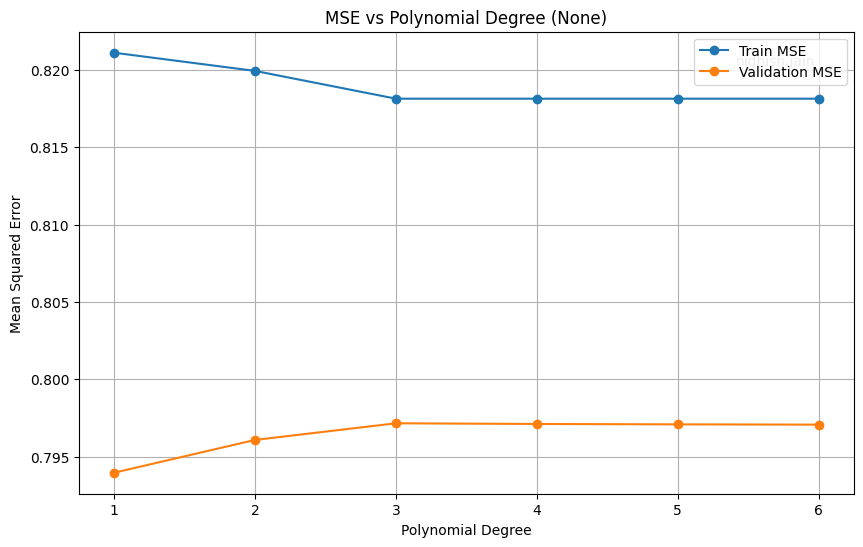

In [17]:
Poly_obj.plot_mse_vs_deg(degree, final[None]['train_mse'], final[None]['val_mse'],None)

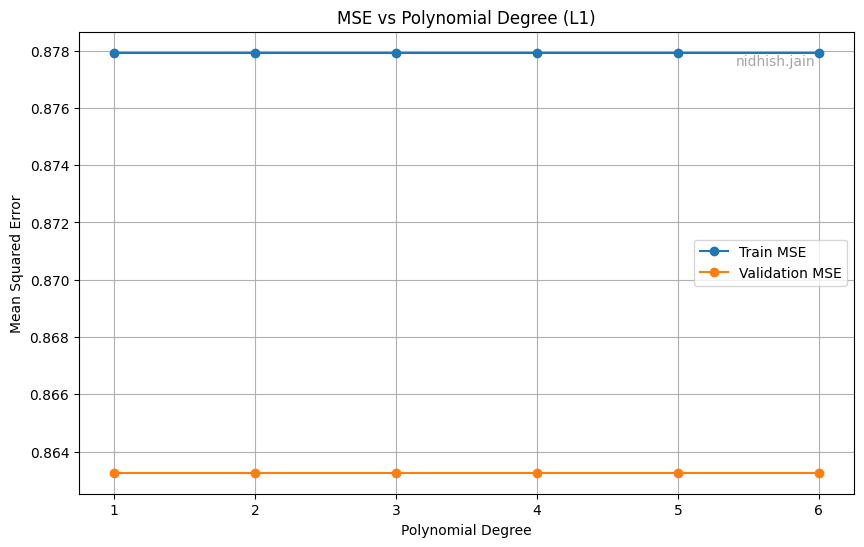

In [18]:
Poly_obj.plot_mse_vs_deg(degree, final['l1']['train_mse'], final['l1']['val_mse'],'L1')

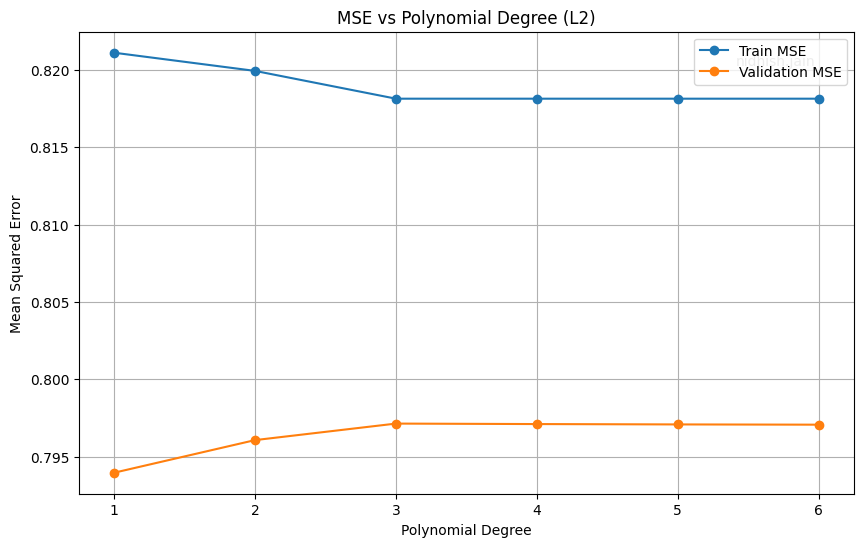

In [19]:
Poly_obj.plot_mse_vs_deg(degree, final['l2']['train_mse'], final['l2']['val_mse'],'L2')

In [20]:
alpha_vals = np.logspace(-4, 4, 10)
print(alpha_vals)

[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04]


In [21]:
# ### Will now check for the different values of alph]
# for reg in regularizer:
#     best_per_degree = []
#     for deg in degree:
#         val_mses = []
#         train_mses = []
        
#         for alpha in alpha_vals:
#             results = Poly_obj.run_poly_regression(
#                 X_train, y_train,
#                 X_val, y_val,
#                 X_test, y_test,
#                 degree=deg,
#                 regularizer=reg,
#                 reg_strength=alpha if reg else 0.0
#             )
#             val_mses.append(results['val_mse'])
#             train_mses.append(results['train_mse'])
        
#         # best alpha for this degree = one with lowest val MSE
#         best_idx = np.argmin(val_mses)
#         best_alpha = alpha_vals[best_idx]
#         best_val_mse = val_mses[best_idx]
#         best_train_mse = train_mses[best_idx]
        
#         best_per_degree.append({
#             "degree": deg,
#             "best_alpha": best_alpha,
#             "val_mse": best_val_mse,
#             "train_mse": best_train_mse
#         })
    
#     # pick the degree with lowest val MSE overall
#     best_deg_idx = np.argmin([d["val_mse"] for d in best_per_degree])
#     best_degree_info = best_per_degree[best_deg_idx]
    
#     final[reg] = {
#         "best_degree": best_degree_info["degree"],
#         "best_alpha": best_degree_info["best_alpha"],
#         "val_mse": best_degree_info["val_mse"],
#         "train_mse": best_degree_info["train_mse"],
#         "all_results": best_per_degree
#     }


In [ ]:
### Will now check for the different values of alph]
final_all = {}
regularization_strength_map = {}
for reg in regularizer: #### its best to store all values for each alpha and reg and deg
    best_per_degree = []
    for deg in degree:
        val_mses = []
        train_mses = []
        if reg is None:
            results = Poly_obj.run_poly_regression(
                X_train, y_train,
                X_val, y_val,
                X_test, y_test,
                degree=deg,
                regularizer=reg,
                reg_strength=0.0
            )
            val_mses.append(results['val_mse'])
            train_mses.append(results['train_mse'])
            final_all[(reg,deg,0.0)] = results
        if reg is not None:
            for alpha in alpha_vals:
                results = Poly_obj.run_poly_regression(
                    X_train, y_train,
                    X_val, y_val,
                    X_test, y_test,
                    degree=deg,
                    regularizer=reg,
                    reg_strength=alpha
                )
                val_mses.append(results['val_mse'])
                train_mses.append(results['train_mse'])
                final_all[(reg,deg,alpha)] = results
            best_idx = np.argmin(val_mses)
            best_alpha = alpha_vals[best_idx]
            best_val_mse = val_mses[best_idx]
            best_train_mse = train_mses[best_idx]
            
            best_per_degree.append({
                "degree": deg,
                "best_alpha": best_alpha,
                "val_mse": best_val_mse,
                "train_mse": best_train_mse
            })
    
    if reg is not None:
        ### now we will find the bestest till now
        print(f"Regularizer: {reg}")
        print("Best per degree:")
        for info in best_per_degree:
            print(f"  Degree: {info['degree']}, Best Alpha: {info['best_alpha']}, Val MSE: {info['val_mse']}, Train MSE: {info['train_mse']}")
        best_idx = np.argmin([d["val_mse"] for d in best_per_degree])
        best_degree_info = best_per_degree[best_idx]

        final[reg] = {
            "best_degree": best_degree_info["degree"],
            "best_alpha": best_degree_info["best_alpha"],
            "val_mse": best_degree_info["val_mse"],
            "train_mse": best_degree_info["train_mse"],
            "all_results": best_per_degree
        }
        ### from final_all of this degree and reg find the val MSE and store in form of the
        ## dict being made which is regularization_strength_map
        ## have to do for all alphas
        regularization_strength_map[reg] = {
            "alpha_vals": alpha_vals,
            "val_mses": [final_all[(reg, best_degree_info["degree"], alpha)]["val_mse"] for alpha in alpha_vals],
            "train_mses": [final_all[(reg, best_degree_info["degree"], alpha)]["train_mse"] for alpha in alpha_vals]
        }

Regularizer: l1
Best per degree:
  Degree: 1, Best Alpha: 0.000774263682681127, Val MSE: 0.7935927484516331, Train MSE: 0.821170153928347
  Degree: 2, Best Alpha: 0.000774263682681127, Val MSE: 0.7943019443533029, Train MSE: 0.8204206138812724
  Degree: 3, Best Alpha: 0.005994842503189409, Val MSE: 0.7943763696325715, Train MSE: 0.8216851751033026
  Degree: 4, Best Alpha: 0.005994842503189409, Val MSE: 0.7943763696325715, Train MSE: 0.8216851751033026
  Degree: 5, Best Alpha: 0.005994842503189409, Val MSE: 0.7943763696325715, Train MSE: 0.8216851751033026
  Degree: 6, Best Alpha: 0.005994842503189409, Val MSE: 0.7943763696325715, Train MSE: 0.8216851751033026
Regularizer: l2
Best per degree:
  Degree: 1, Best Alpha: 0.0001, Val MSE: 0.7939584930895031, Train MSE: 0.8211191789690967
  Degree: 2, Best Alpha: 21.54434690031882, Val MSE: 0.7954782645483035, Train MSE: 0.8200437555194345
  Degree: 3, Best Alpha: 166.81005372000558, Val MSE: 0.7961343296668546, Train MSE: 0.819467581626412
 

In [24]:
print(len(final_all))

126


In [25]:
print(final_all)

{(None, 1, 0.0): {'train_mse': 0.8211191789690955, 'val_mse': 0.7939584916410345, 'test_mse': 0.8285984951999777, 'coefficients': {'gender_Female': -0.00808850493825712, 'gender_Male': -0.061173950273394145, 'gender_Other': 0.06926245521165161, 'major_B.Tech': -0.7498258132044262, 'major_MS': 0.19947227207004783, 'major_PhD': 0.5503535411343738, 'program_CHD': -0.01309566498576468, 'program_CND': 0.021019845143185327, 'program_CSE': -0.013205709741312417, 'program_ECE': 0.0052815295838917475}}, (None, 2, 0.0): {'train_mse': 0.8199433406679216, 'val_mse': 0.7960796726809115, 'test_mse': 0.8285414022816642, 'coefficients': {'gender_Female': 0.021042055980974073, 'gender_Male': 0.0019100040243543778, 'gender_Other': -0.022952060005330233, 'major_B.Tech': -0.2610743466965143, 'major_MS': 0.07893599264960242, 'major_PhD': 0.18213835404691125, 'program_CHD': -0.04201872338524387, 'program_CND': 0.03271689637427977, 'program_CSE': -0.003941410476016011, 'program_ECE': 0.013243237486979892, 'g